## Plot image - edited from Dirk Colbry's notebook

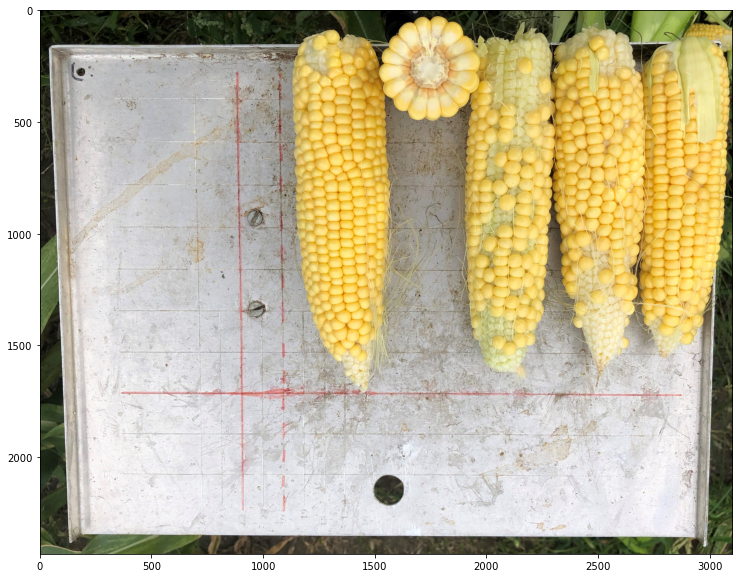

In [1]:
from imageio import imread, imsave
from matplotlib.pylab import plt
import numpy as np

filename = ('man_cropped_IMG_8248.jpg')

img = imread(filename)
plt.figure(figsize=(20,10));
plt.imshow(img)

In [3]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install plantcv

## Crop Image from Miles and Joshua

In [2]:
# Let's try on all of the images from the original set

fileNames = ['IMG_8248.jpg']

final_fileNames = []

from imageio import imread, imsave
from matplotlib.pylab import plt
import numpy as np
import skimage
import skimage.morphology
from scipy.ndimage.measurements import label
from scipy.ndimage.measurements import find_objects
from skimage.morphology import remove_small_objects
from urllib.request import urlopen, urlretrieve
from imageio import imread, imsave
from matplotlib.pylab import plt
import numpy as np
from skimage import exposure #histogram equalization
import colorsys #To convert to rbg to hsv color space
import matplotlib.colors as colors
import os #For getting list of files
from scipy import ndimage #For performing erosion and dilation

#Get list of photo names
#Define thresholds for isolating tray in photos
hmin = -0.01
hmax = 1.01
smin = -0.01
smax = 0.05
vmin = -0.01
vmax = 1.01

#Function for calculating run lengths in a binary array
#function is from: https://stackoverflow.com/questions/1066758/find-length-of-sequences-of-identical-values-in-a-numpy-array-run-length-encodi
def rle(inarray):
        """ run length encoding. Partial credit to R rle function. 
            Multi datatype arrays catered for including non Numpy
            returns: tuple (runlengths, startpositions, values) """
        ia = np.asarray(inarray)                # force numpy
        n = len(ia)
        if n == 0: 
            return (None, None, None)
        else:
            y = ia[1:] != ia[:-1]               # pairwise unequal (string safe)
            i = np.append(np.where(y), n - 1)   # must include last element posi
            z = np.diff(np.append(-1, i))       # run lengths
            p = np.cumsum(np.append(0, z))[:-1] # positions
            return(z, p, ia[i])

conversion_dict = {}        

#Loop over photos and crop them
for fileName in fileNames:
    #Load picture
    im = imread(fileName)
    
    #Histogram equalization
    im2 = exposure.equalize_hist(im)
    
    #convert from rgb to hsv color space, pull out matrices
    hsv = colors.rgb_to_hsv(im2)
    h = hsv[:,:,0]; #hue matrix
    s = hsv[:,:,1]; #saturation matrix
    v = hsv[:,:,2]; #value matrix (i.e. brightness)
    
    #Convert to binary image based on thresholds
    # trick because the color space wraps
    if hmin > hmax:
        b_img = (h > hmin) | (h < hmax)
    else:
        b_img = (h > hmin) & (h < hmax);
    b_img = (b_img & 
        (s > smin) & (s < smax) & 
        (v > vmin) & (v < vmax));
    
    #Clean up binary image with erosion and dilation
    b4 = skimage.morphology.remove_small_holes(b_img,area_threshold=50000) # removing holes
    b5 = skimage.morphology.remove_small_holes(b4,area_threshold=10000) # removing holes again
    b6 = skimage.morphology.remove_small_holes(b5,area_threshold=10000) # removing even more holes
    b8 = remove_small_objects(b6,min_size=50000) #removing any chaff 
    
    #Label objects in binary image
    lab, num_features = ndimage.measurements.label(b8)
    
    #Sum togther rows and columns of binary array to determine which pixels represent the tray (labeled as object 1) 
    a1 = np.sum(lab==1,axis=1)
    a0 = np.sum(lab==1,axis=0)
    
    #Convert binary arrays to logical arrays. Now just need to find longest run of False elements in each array
    al0 = a0 > min(a0)
    al1 = a1 > min(a1)
    
    #Calculate run lengths
    runLengths0 = rle(al0)
    runLengths1 = rle(al1)
    
    #Focus on columns
    ##Find index of where longest run begins
    runs0 = runLengths0[0]
    positions0 =  runLengths0[1]
    maxRun0 = max(runs0)
    result = np.where(runs0 == maxRun0)
    ##Calculate where longest run ends
    index = np.asarray(result)
    startCol = positions0[index].tolist()[0][0] - 120
    endCol = startCol + maxRun0 + 240
    
    #Focus on rows
    ##Find index of where longest run begins
    runs1 = runLengths1[0]
    positions1 =  runLengths1[1]
    maxRun1 = max(runs1)
    result = np.where(runs1 == maxRun1)
    ##Calculate where longest run ends
    index = np.asarray(result)
    startRow = positions1[index].tolist()[0][0] - 120
    endRow = startRow + maxRun1 + 240
    
    # calculate conversion factor by relating run lengths identified above (maxRun0 is columns and maxRun1 is rows)
    # and updating a dictionary, called conversion_dict, with a fileName to conversion factor key:value relationship.
    # Note that we don't want to overwrite our files, so we create a 'finalFilename' ahead of time, use that to
    # create the dictionary, and then use it to also export our new images. Additionally, we take the average of the
    # pixel-to-cm relationships for extra robustness
    
    finalFilename = "testing_" + fileName
    
    top_bottom_in_cm = 38.5
    left_right_in_cm = 29.4
    conversion_top_bottom = top_bottom_in_cm / maxRun0
    conversion_left_right = left_right_in_cm / maxRun1
    average_conversion = (conversion_top_bottom + conversion_left_right) / 2
    new_addition = {finalFilename:average_conversion}
    
    #Crop and save image
    try:  
        im3 = im2[startRow:endRow,startCol:endCol]
        imsave(finalFilename, im3)
        final_fileNames.append(finalFilename)
        conversion_dict.update(new_addition)
    except:
        continue

C:\Users\Thila\anaconda3\lib\site-packages\skimage\exposure\exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  hist, bin_centers = histogram(image, nbins)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


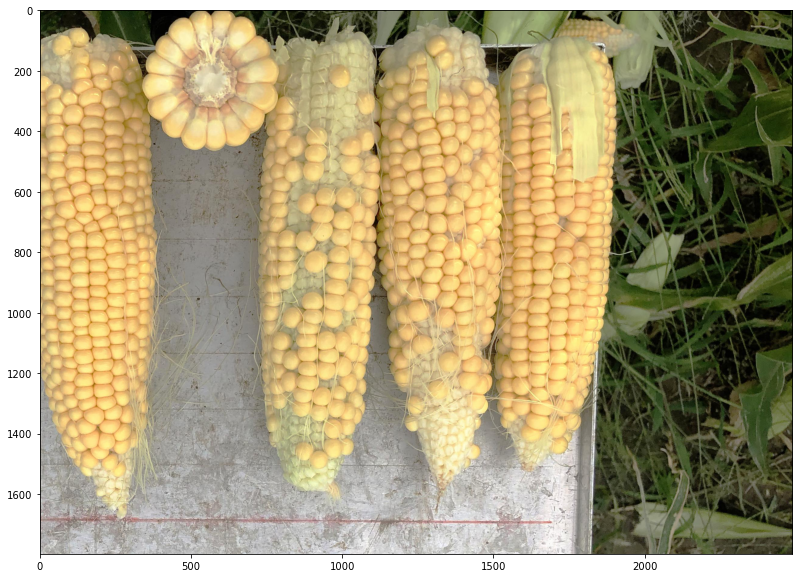

In [3]:
crop = imread('testing_IMG_8248.jpg')
plt.figure(figsize=(20,10));
plt.imshow(crop)

## PlantCV Edge Detection

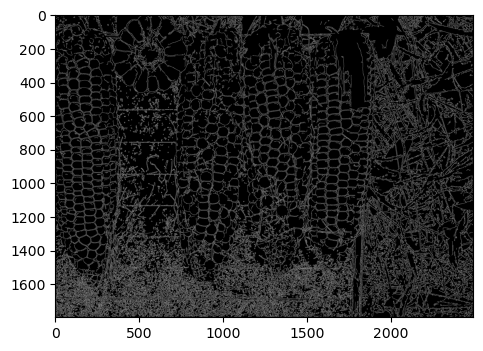

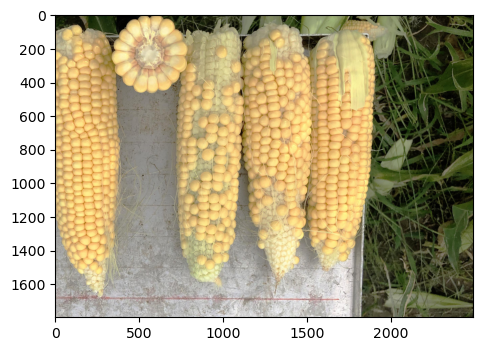

In [188]:
from plantcv import plantcv

# Set global debug behavior to None (default), "print" (to file), 
# or "plot" (Jupyter Notebooks or X11)
plantcv.params.debug = "plot"



filename = ('testing_IMG_8248.jpg')

testing_image = imread(filename)
# Create binary image of edges.
edges = plantcv.canny_edge_detect(testing_image)
plt.imshow(testing_image)

In [10]:
edges3 = plantcv.canny_edge_detect(testing_image, mask=None, sigma=1.0, low_thresh=None, high_thresh=None, thickness=1, mask_color=None, use_quantiles=False)

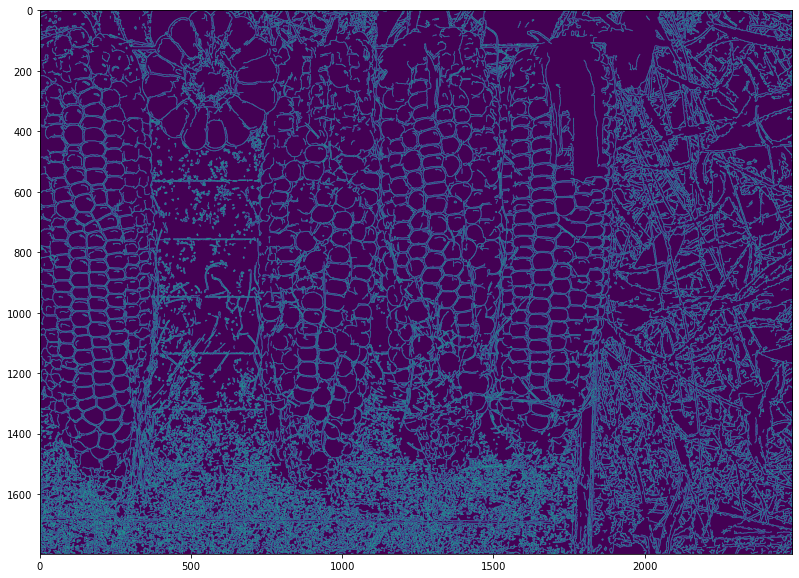

In [11]:
plt.figure(figsize=(20,10));
plt.imshow(edges3)

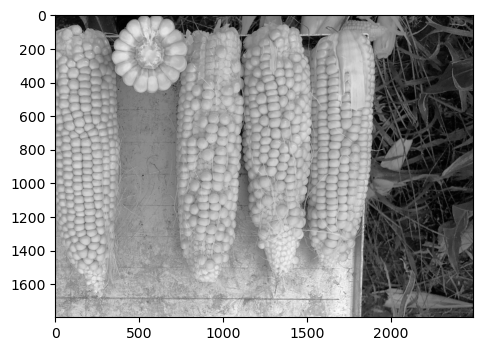

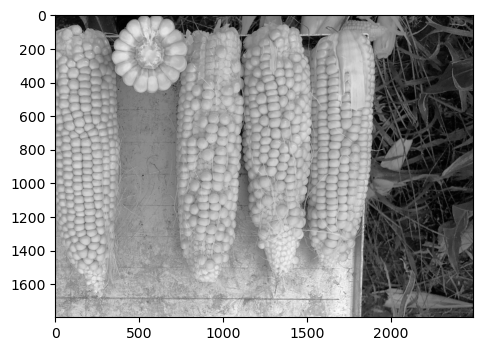

In [189]:
   # Convert RGB to HSV and extract the saturation channel

    # Inputs:
    #   rgb_image - RGB image data 
    #   channel - Split by 'h' (hue), 's' (saturation), or 'v' (value) channel
gray = plantcv.rgb2gray(testing_image )
plt.imshow(gray, cmap='gray', vmin = 0, vmax = 255) #image

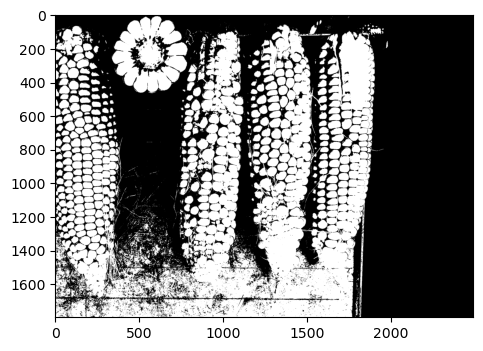

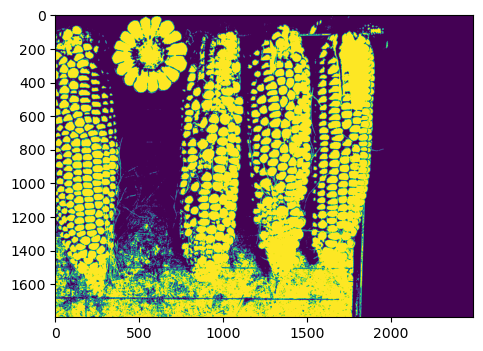

In [190]:
#threshold of 150-180 looks to isolate the ears best
s_thresh = plantcv.threshold.binary(gray_img=gray, threshold=160, max_value=255, object_type='light')
plt.imshow(s_thresh)

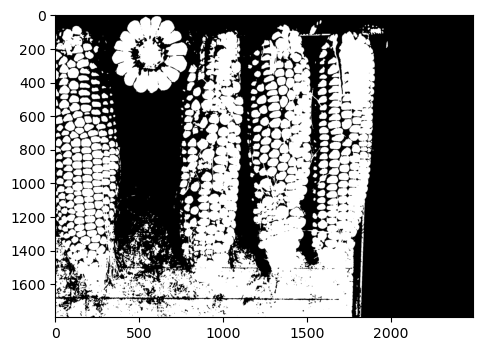

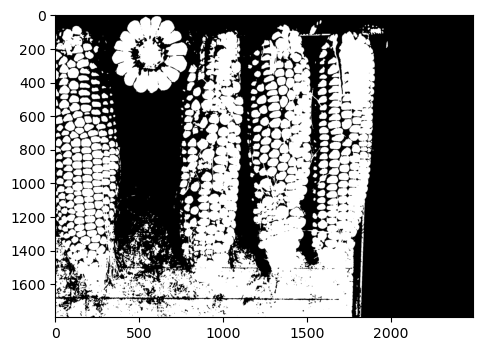

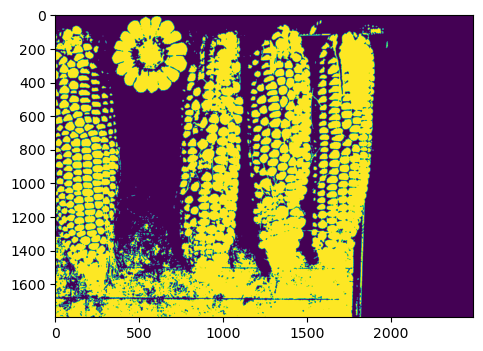

In [191]:
    # Median Blur
    # Inputs: 
    #   gray_img - Grayscale image data 
    #   ksize - Kernel size (integer or tuple), (ksize, ksize) box if integer input,
    #           (n, m) box if tuple input 
s_mblur = plantcv.median_blur(gray_img=s_thresh, ksize=5)
s_cnt = plantcv.median_blur(gray_img=s_thresh, ksize=5)
plt.imshow(s_mblur)
plt.imshow(s_cnt)

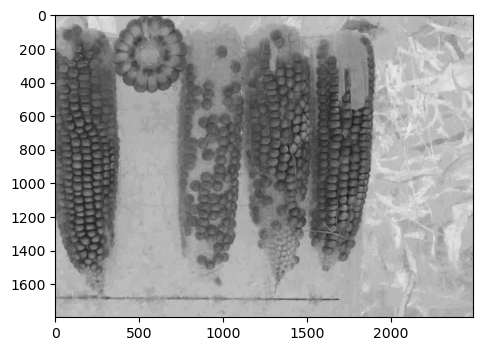

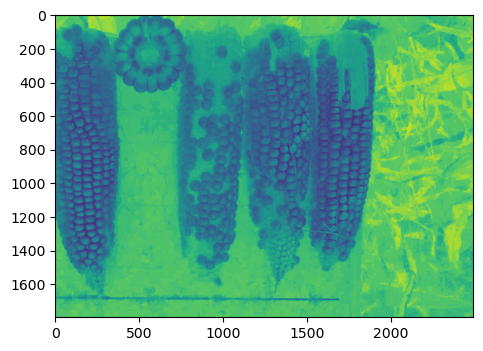

In [192]:
    # Convert RGB to LAB and extract the Blue channel

    # Input:
    #   rgb_img - RGB image data 
    #   channel- Split by 'l' (lightness), 'a' (green-magenta), or 'b' (blue-yellow) channel
b = plantcv.rgb2gray_lab(rgb_img=testing_image, channel='b')

    # Threshold the blue image


plt.imshow(b)

    # Fill small objects (optional)
#b_fill = plantcv.fill(b_thresh, 10)

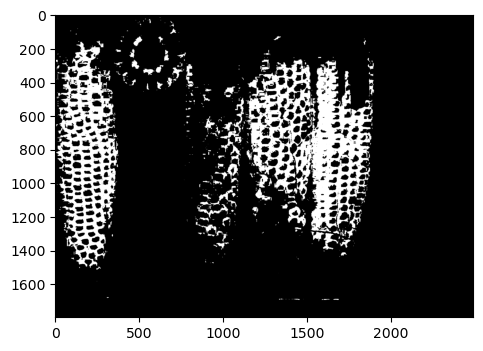

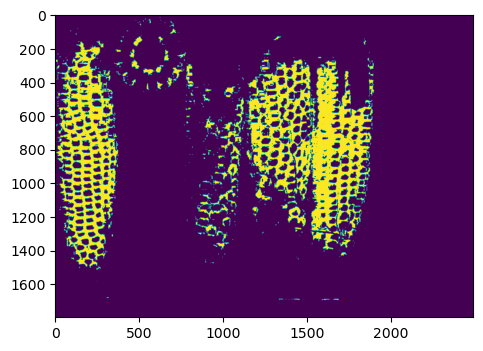

In [229]:
#110-120 threshold value works best
b_thresh = plantcv.threshold.binary(gray_img=b, threshold=100, max_value=255, 
                                    object_type='dark')
plt.imshow(b_thresh)


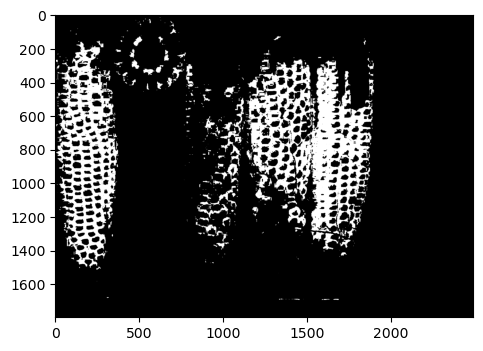

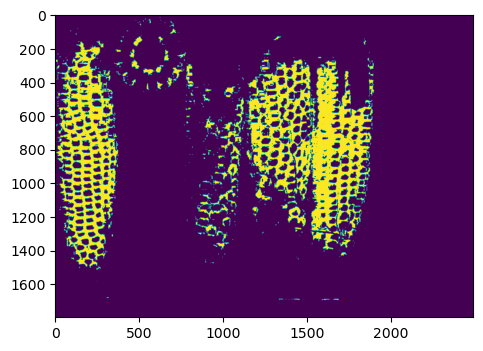

In [228]:
b_cnt = plantcv.threshold.binary(gray_img=b, threshold=100, max_value=255, 
                                 object_type='dark')
plt.imshow(b_cnt)

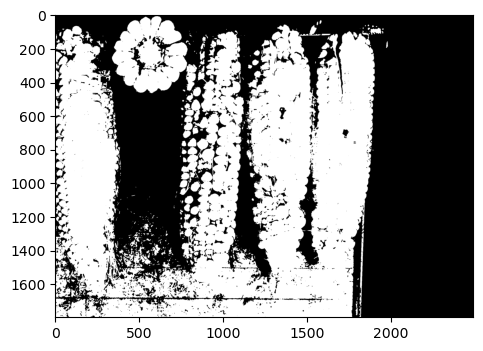

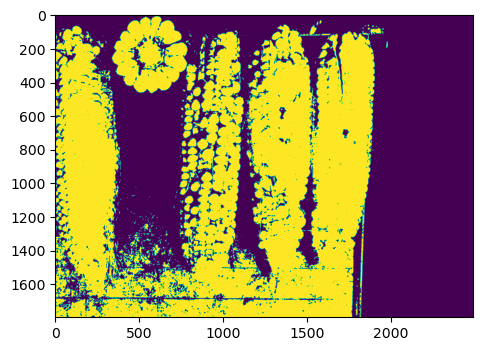

In [230]:
    # Join the thresholded saturation and blue-yellow images

    # Inputs: 
    #   bin_img1 - Binary image data to be compared to bin_img2
    #   bin_img2 - Binary image data to be compared to bin_img1
bs = plantcv.logical_or(bin_img1=s_mblur, bin_img2=b_cnt)
plt.imshow(bs)

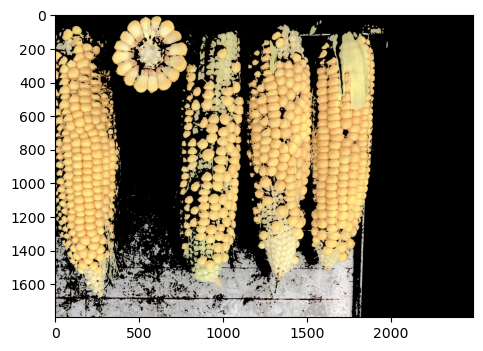

In [231]:
    # Apply Mask (for VIS images, mask_color=white)

    # Inputs:
    #   rgb_img - RGB image data 
    #   mask - Binary mask image data 
    #   mask_color - 'white' or 'black' 
masked = plantcv.apply_mask(img=testing_image, mask=bs, mask_color='black')
plt.imshow(masked)

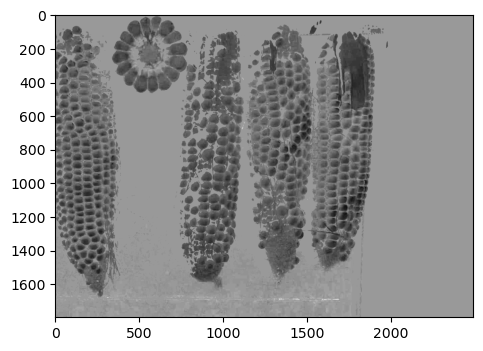

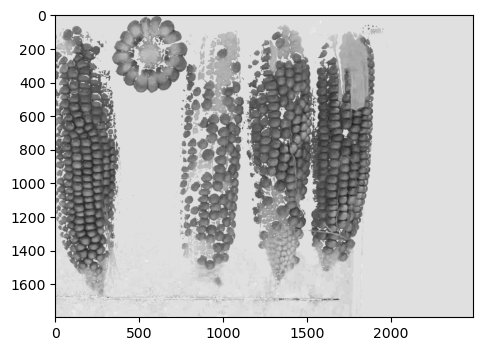

In [232]:
# Convert RGB to LAB and extract the Green-Magenta and Blue-Yellow channels
masked_a = plantcv.rgb2gray_lab(rgb_img=masked, channel='a')
masked_b = plantcv.rgb2gray_lab(rgb_img=masked, channel='b')

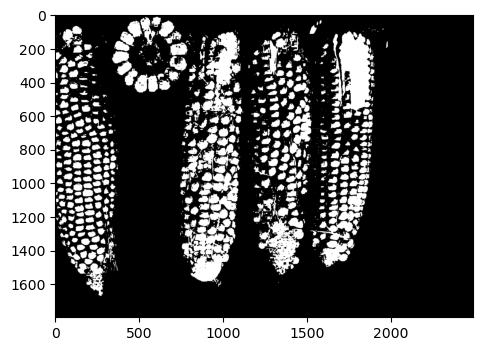

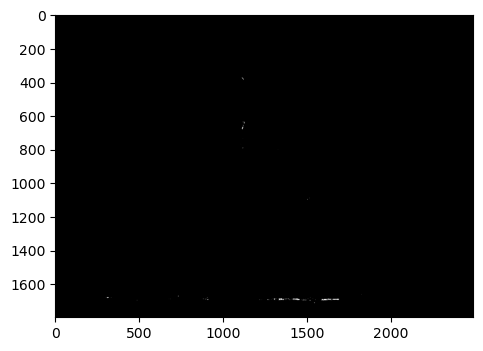

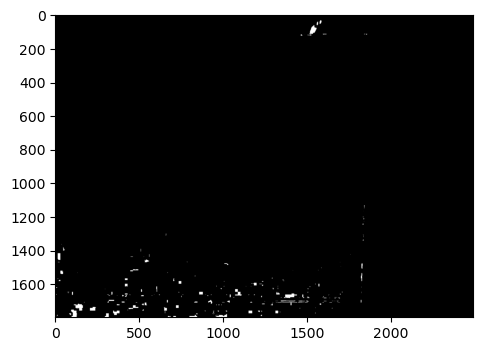

In [233]:
 # Threshold the green-magenta and blue images
maskeda_thresh = plantcv.threshold.binary(gray_img=masked_a, threshold=115, 
                                      max_value=255, object_type='dark')
maskeda_thresh1 = plantcv.threshold.binary(gray_img=masked_a, threshold=135, 
                                           max_value=255, object_type='light')
maskedb_thresh = plantcv.threshold.binary(gray_img=masked_b, threshold=128, 
                                          max_value=255, object_type='light')

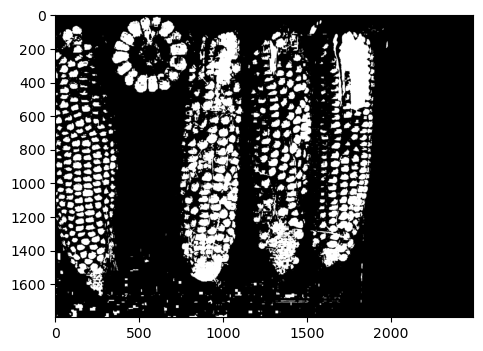

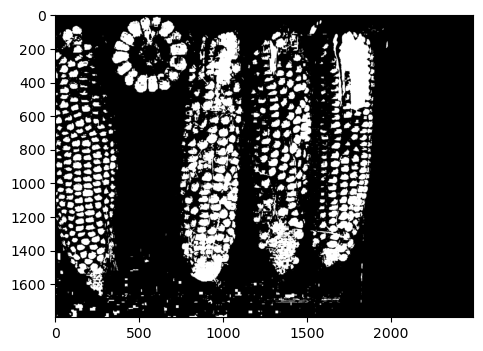

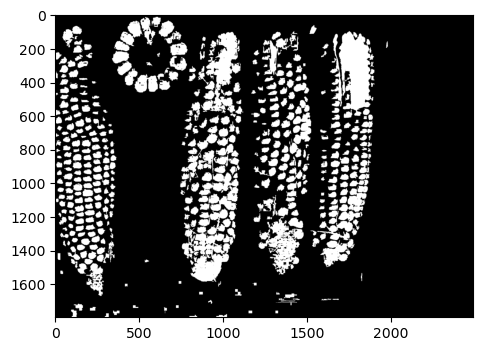

In [234]:
 # Join the thresholded saturation and blue-yellow images (OR)
ab1 = plantcv.logical_or(bin_img1=maskeda_thresh, bin_img2=maskedb_thresh)
ab = plantcv.logical_or(bin_img1=maskeda_thresh1, bin_img2=ab1)

    # Fill small objects
    # Inputs: 
    #   bin_img - Binary image data 
    #   size - Minimum object area size in pixels (must be an integer), and smaller objects will be filled
ab_fill = plantcv.fill(bin_img=ab, size=200)

    # Apply mask (for VIS images, mask_color=white)
masked2 = plantcv.apply_mask(img=masked, mask=ab_fill, mask_color='white')


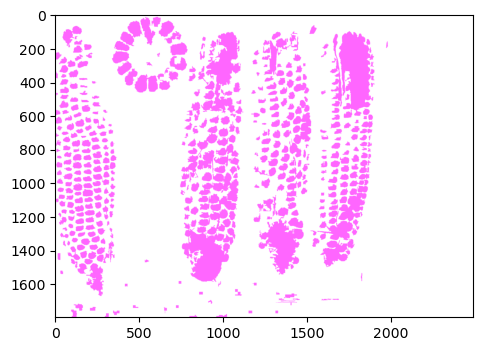

In [235]:
    # Identify objects
id_objects, obj_hierarchy = plantcv.find_objects(masked2, ab_fill)

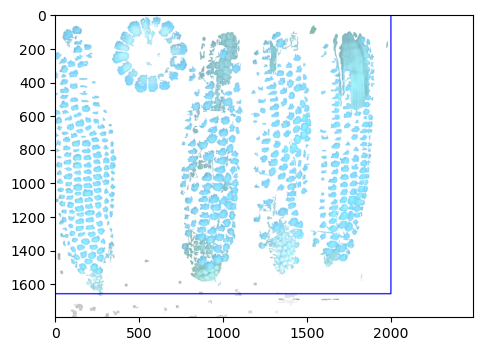

In [236]:
    # Define ROI

    # Inputs: 
    #   img - RGB or grayscale image to plot the ROI on 
    #   x - The x-coordinate of the upper left corner of the rectangle 
    #   y - The y-coordinate of the upper left corner of the rectangle 
    #   h - The height of the rectangle 
    #   w - The width of the rectangle 
roi1, roi_hierarchy= plantcv.roi.rectangle(img=masked2, x=0, y=0, h=1660, w=2000)

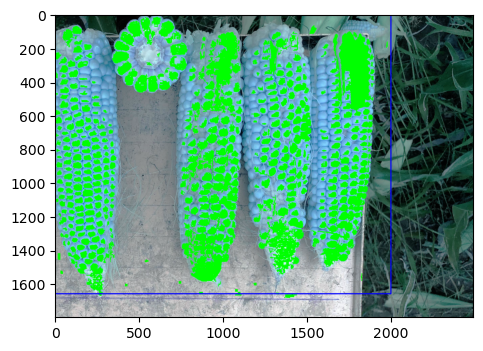

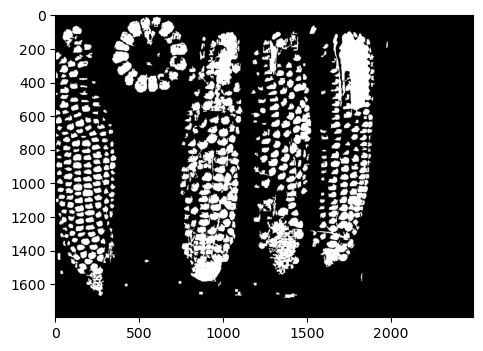

In [237]:
    # Decide which objects to keep
    # Inputs:
    #    img            = img to display kept objects
    #    roi_contour    = contour of roi, output from any ROI function
    #    roi_hierarchy  = contour of roi, output from any ROI function
    #    object_contour = contours of objects, output from pcv.find_objects function
    #    obj_hierarchy  = hierarchy of objects, output from pcv.find_objects function
    #    roi_type       = 'partial' (default, for partially inside), 'cutto', or 
    #    'largest' (keep only largest contour)
roi_objects, hierarchy3, kept_mask, obj_area = plantcv.roi_objects(img=testing_image, roi_contour=roi1, 
                                                                   roi_hierarchy=roi_hierarchy, 
                                                                   object_contour=id_objects, 
                                                                   obj_hierarchy=obj_hierarchy,
                                                                   roi_type='partial')


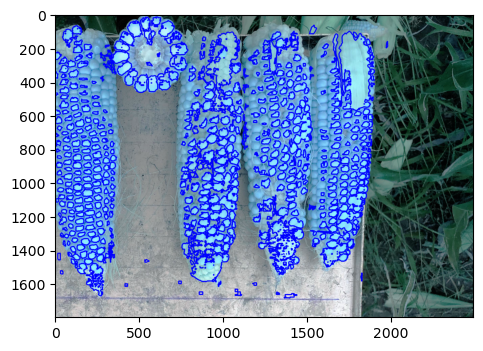

In [218]:
    # Object combine kept objects
    # Inputs:
    #   img - RGB or grayscale image data for plotting 
    #   contours - Contour list 
    #   hierarchy - Contour hierarchy array 
obj, mask = plantcv.object_composition(img=testing_image, contours=roi_objects, hierarchy=hierarchy3)

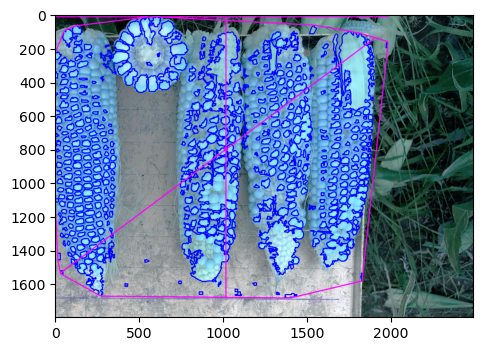

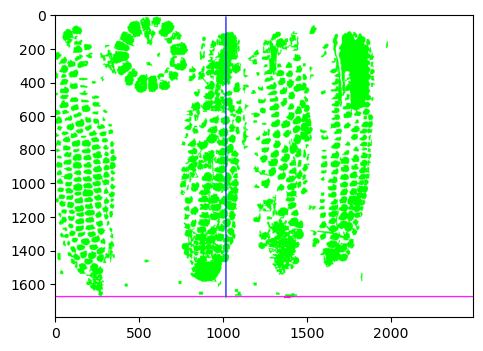

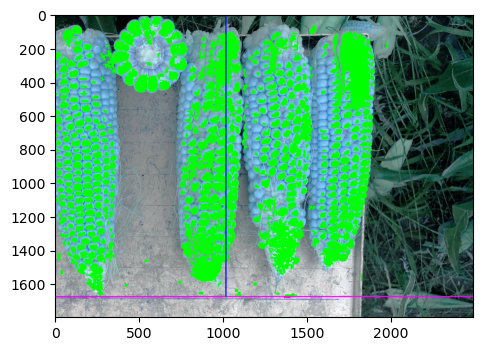

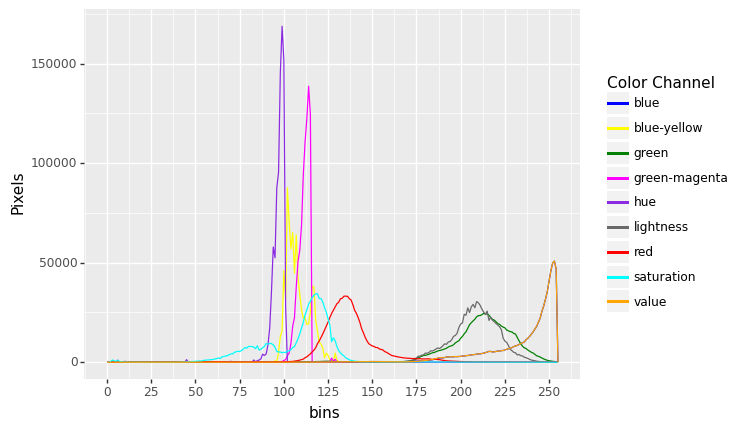

<ggplot: (82486709881)>


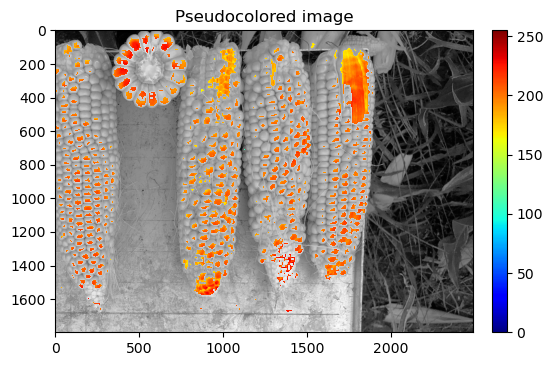

NameError: name 'file' is not defined

In [226]:
   ############### Analysis ################


    # Find shape properties, output shape image (optional)

    # Inputs:
    #   img - RGB or grayscale image data 
    #   obj- Single or grouped contour object
    #   mask - Binary image mask to use as mask for moments analysis  
    #   label - Optional label parameter, modifies the variable name of observations recorded   
shape_img = plantcv.analyze_object(img=testing_image, obj=obj, mask=mask, label="default")

    # Shape properties relative to user boundary line (optional)

    # Inputs:
    #   img - RGB or grayscale image data 
    #   obj - Single or grouped contour object 
    #   mask - Binary mask of selected contours 
    #   line_position - Position of boundary line (a value of 0 would draw a line 
    #                   through the bottom of the image)
    #   label - Optional label parameter, modifies the variable name of observations recorded  
boundary_img1 = plantcv.analyze_bound_horizontal(img=testing_image, obj=obj, mask=mask, 
                                                   line_position=1680, label="default")

    # Determine color properties: Histograms, Color Slices, output color analyzed histogram (optional)

    # Inputs:
    #   rgb_img - RGB image data
    #   mask - Binary mask of selected contours 
    #   hist_plot_type - None (default), 'all', 'rgb', 'lab', or 'hsv'
    #                    This is the data to be printed to the SVG histogram file 
    #   label - Optional label parameter, modifies the variable name of observations recorded  
color_histogram = plantcv.analyze_color(rgb_img=testing_image, mask=mask, hist_plot_type='all', label="default")

    # Pseudocolor the grayscale image

    # Inputs:
    #     gray_img - Grayscale image data
    #     obj - Single or grouped contour object (optional), if provided the pseudocolored image gets 
    #           cropped down to the region of interest.
    #     mask - Binary mask (optional) 
    #     background - Background color/type. Options are "image" (gray_img, default), "white", or "black". A mask 
    #                  must be supplied.
    #     cmap - Colormap
    #     min_value - Minimum value for range of interest
    #     max_value - Maximum value for range of interest
    #     dpi - Dots per inch for image if printed out (optional, if dpi=None then the default is set to 100 dpi).
    #     axes - If False then the title, x-axis, and y-axis won't be displayed (default axes=True).
    #     colorbar - If False then the colorbar won't be displayed (default colorbar=True)
pseudocolored_img = plantcv.visualize.pseudocolor(gray_img=gray, mask=mask, cmap='jet')

    # Write shape and color data to results file
plantcv.print_results(filename=file)


## PlantCV Color Characterization

In [238]:
# Analyze Color

analysis_image = plantcv.analyze_color(testing_image, mask='default', hist_plot_type='all', label="default")

# Access data stored out from analyze_color
hue_circular_mean = plantcv.outputs.observations['default']['hue_circular_mean']['value']

TypeError: Expected Ptr<cv::UMat> for argument 'mask'

Text(0.5, 1.0, 'Historgams for Overlayed Red, Green and Blue Channels of a color image')

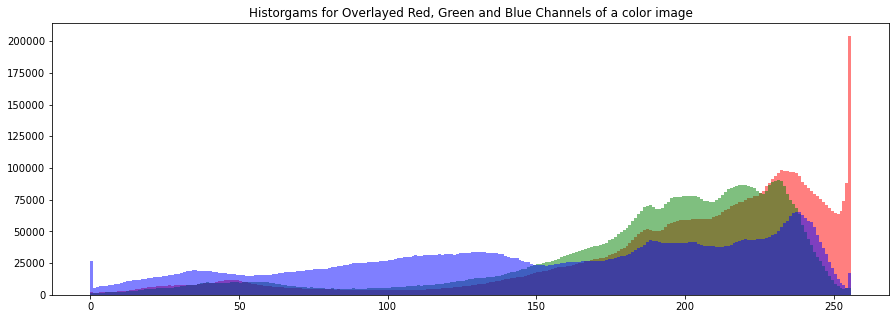

In [29]:
fig = plt.figure(figsize=(15,5))

plt.hist(img[:,:,0].ravel(), alpha=0.5, bins=256, range=(0, 256), color='red');
plt.hist(img[:,:,1].ravel(), alpha=0.5, bins=256, range=(0, 256), color='green');
plt.hist(img[:,:,2].ravel(), alpha=0.5, bins=256, range=(0, 256), color='blue');
plt.title('Historgams for Overlayed Red, Green and Blue Channels of a color image')

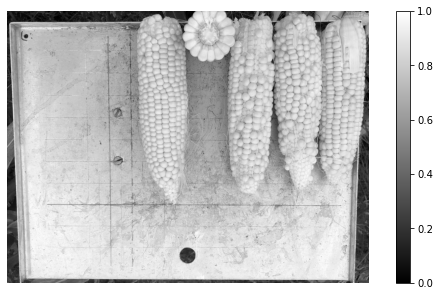

In [30]:
import matplotlib.pylab as plt
import skimage.color as color

gray = color.rgb2gray(img)

plt.figure(figsize=(10,5));
plt.imshow(gray, cmap='gray');
plt.axis('off')
plt.colorbar();

In [10]:
s = plantcv.rgb2gray_hsv(img, channel='s')
h = plantcv.rgb2gray_hsv(img, channel= 'h')
v = plantcv.rgb2gray_hsv(img, channel= 'v')

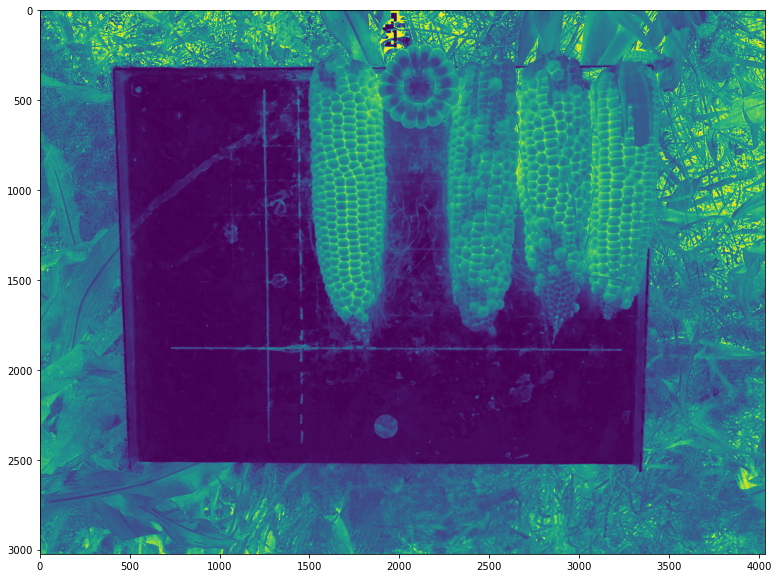

In [11]:
plt.figure(figsize=(20,10));
plt.imshow(s)

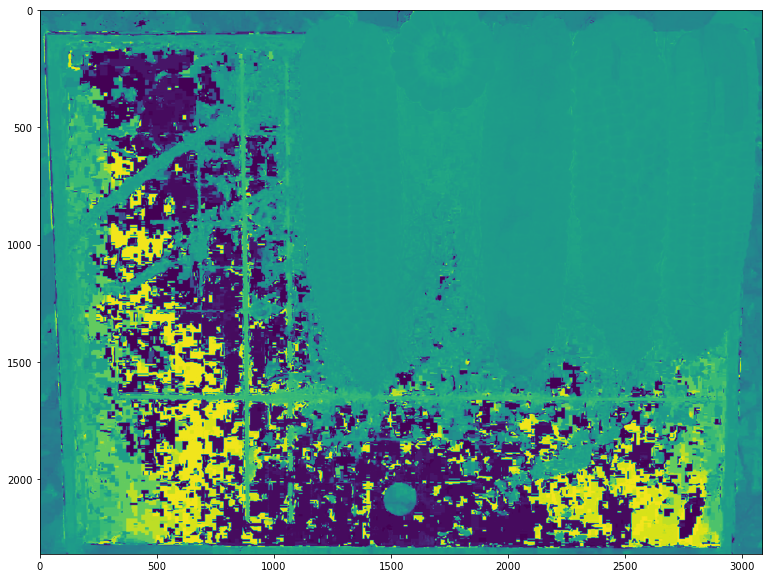

In [48]:
plt.figure(figsize=(20,10));
plt.imshow(h)

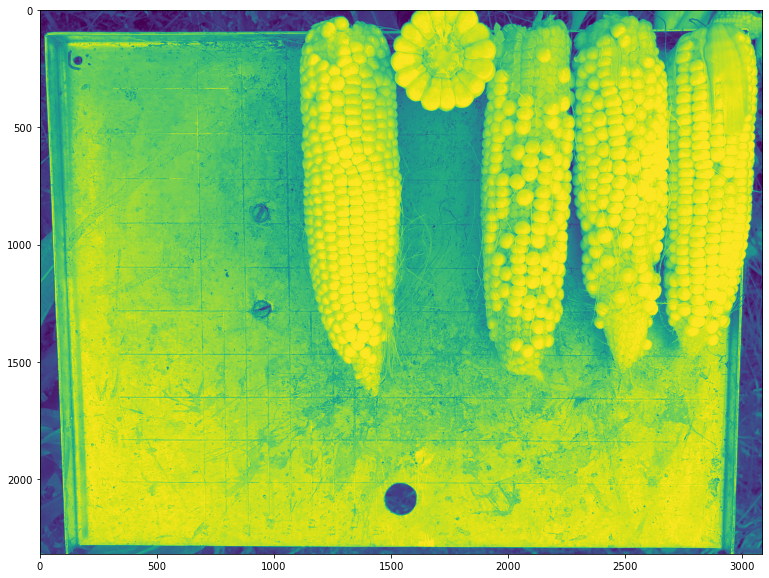

In [7]:
plt.figure(figsize=(20,10));
plt.imshow(v)

In [42]:
edges5 = plantcv.canny_edge_detect(s, mask=None, sigma=1.0, low_thresh=None, high_thresh=None, thickness=1, mask_color=None, use_quantiles=False)

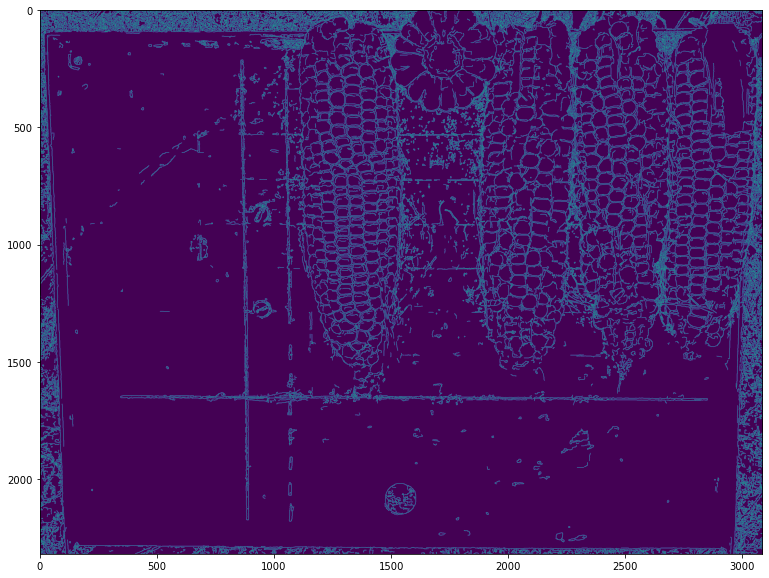

In [43]:
plt.figure(figsize=(20,10));
plt.imshow(edges5)

Text(0.5, 1.0, 'Saturation-HSV')

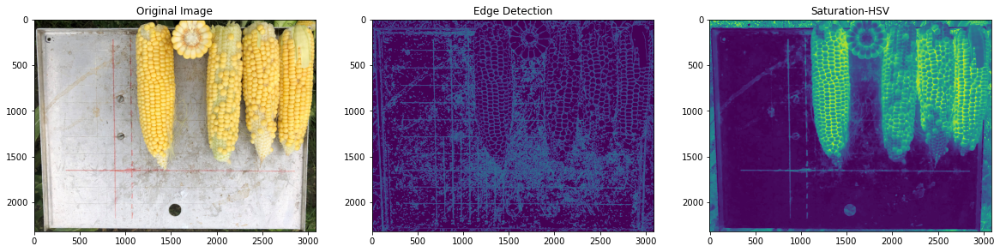

In [49]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3,figsize=(20,10))

ax1.imshow(img)
ax1.set_title('Original Image')
ax2.imshow(edges3)
ax2.set_title('Edge Detection')
ax3.imshow(s)
ax3.set_title('Saturation-HSV')

## PlantCV Shape Characterization

In [12]:
# Characterize object shapes

shape_image = plantcv.analyze_object(img, obj, mask, label="default")

NameError: name 'obj' is not defined